# T cells intergration
## Xiaonan Wang
## 05Oct2020

Integration of PBMC T cells and *in vitro* CAR T-cells.

In [9]:
#%matplotlib nbagg
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import anndata
import smqpp
import re
import seaborn as sns
import scipy.spatial as sp, scipy.cluster.hierarchy as hc
from scipy.cluster.hierarchy import fcluster
import matplotlib.patches as mpatches
import bbknn

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300)
sc.logging.print_versions()

scanpy==1.5.0 anndata==0.7.1 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1 leidenalg==0.7.0


In [1]:
import sys
sys.path.append('./source_code/')
from CarT_source_code import *

In [2]:
PBMC_Tcells_data = sc.read('./write/PBMC_Tcells_processed.h5ad')
PBMC_Tcells_data = anndata.AnnData(X=PBMC_Tcells_data.raw.X, var=PBMC_Tcells_data.raw.var, obs=PBMC_Tcells_data.obs)
Tcells_data = sc.read('./write/Tcells_processed_regressedout.h5ad')
Tcells_data = anndata.AnnData(X=Tcells_data.raw.X, var=Tcells_data.raw.var, obs=Tcells_data.obs)

In [3]:
adata = PBMC_Tcells_data.concatenate(Tcells_data)
print(adata.shape)

(48743, 19442)


In [4]:
adata.raw = adata

In [5]:
adata.obs['batch'].value_counts()

1    37898
0    10845
Name: batch, dtype: int64

In [6]:
# find highly variable genes
# parameters are mainly selected depends on user preference
sc.pp.highly_variable_genes(
    adata, min_mean=0.02, max_mean=3, min_disp=0.5, batch_key='batch', inplace=True)

extracting highly variable genes


... storing 'Barcode' as categorical
... storing 'CT' as categorical
... storing 'Condition' as categorical
... storing 'ExCells' as categorical
... storing 'Proj_PBMC68K' as categorical
... storing 'Proj_PBMC68K_new' as categorical
... storing 'Sample' as categorical
... storing 'Sub_con' as categorical
... storing 'Sub_con1' as categorical
... storing 'Sub_con2' as categorical
... storing 'Vec_binary' as categorical
... storing 'comb_con' as categorical
... storing 'comb_con1' as categorical
... storing 'leiden_v1' as categorical
... storing 'louvain_v1' as categorical
... storing 'pred_CD_pca' as categorical
... storing 'realCD' as categorical
... storing 'realCD_CT' as categorical
... storing 'test' as categorical


    finished (0:00:56)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


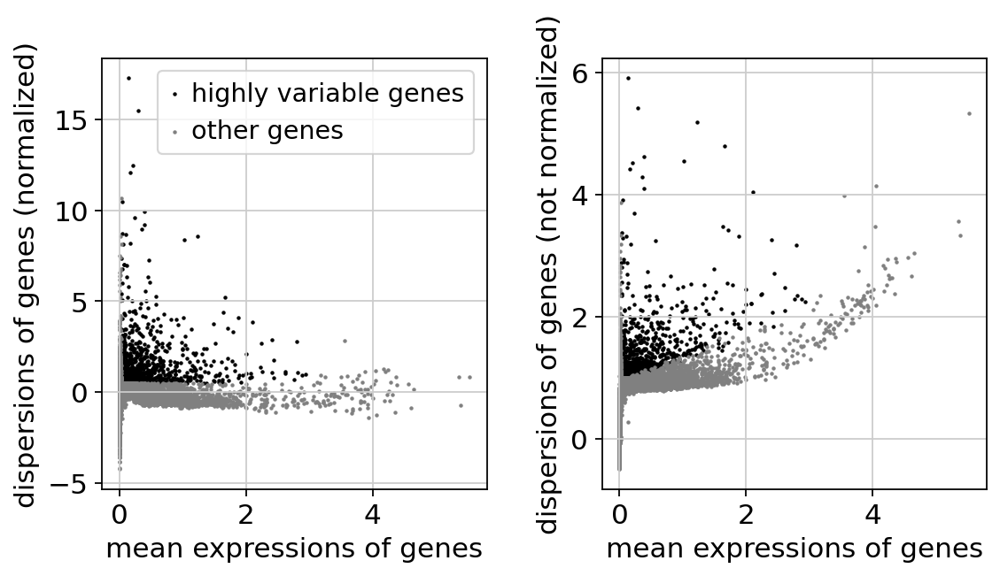

In [7]:
sc.pl.highly_variable_genes(adata)

In [8]:
print(np.sum(adata.var.highly_variable))

1136


In [9]:
adata = adata[:, adata.var.highly_variable]

In [10]:
adata.write('./write/Tcells_combined_lognorm_hvg.h5ad')

In [11]:
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:848: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:19)


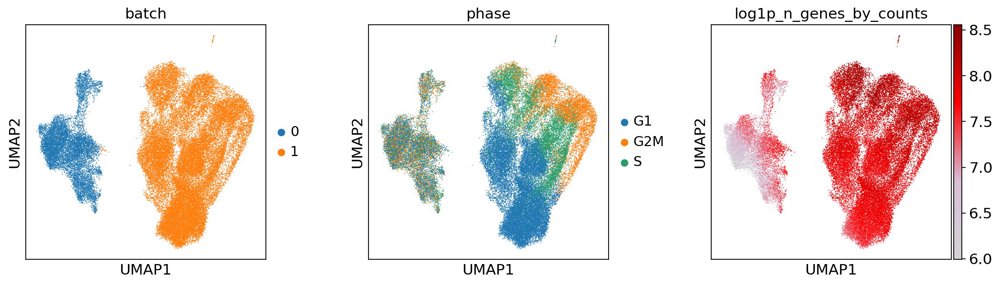

In [12]:
sc.pl.umap(adata, color=['batch', 'phase', 'log1p_n_genes_by_counts'], color_map=cmap, wspace=0.3)

In [13]:
# Fernando's key marker gene list
GL4 = ['CD3D', 'CD8A', 'CD4', 'CCR7', 'SELL', 'NKG7', 'GNLY', 'NCAM1', 'IL2RA']

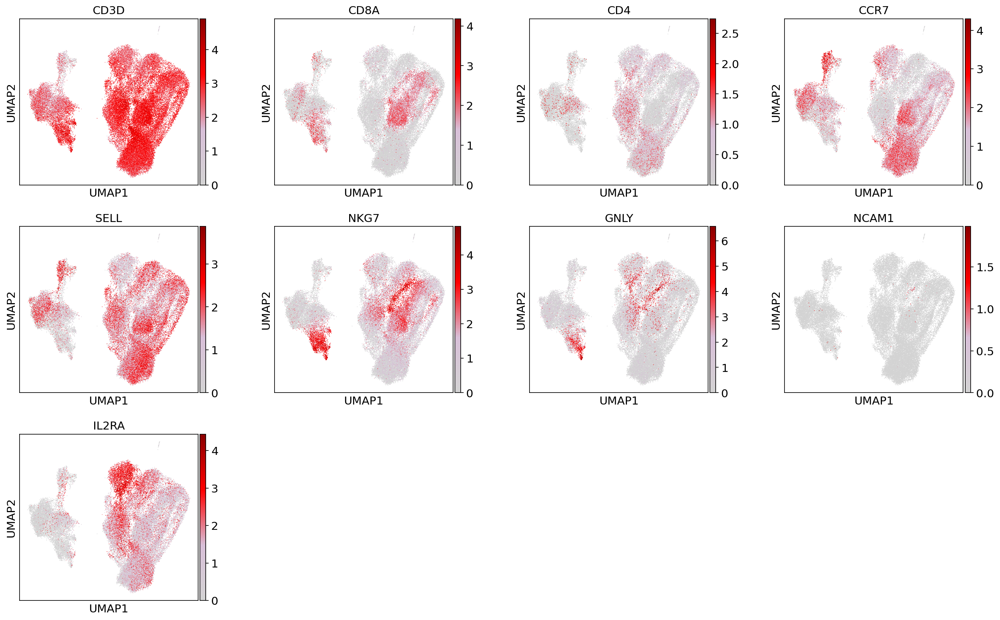

In [14]:
sc.pl.umap(adata, color=GL4, color_map=cmap, wspace=0.3)

In [15]:
adata.write('./write/Tcells_combined_processed.h5ad')

In [16]:
adata = sc.read('./write/Tcells_combined_lognorm_hvg.h5ad')

In [17]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'G2M_score', 'S_score', 'n_genes_by_counts'])

regressing out ['total_counts', 'pct_counts_mt', 'G2M_score', 'S_score', 'n_genes_by_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:52)


In [18]:
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:24)


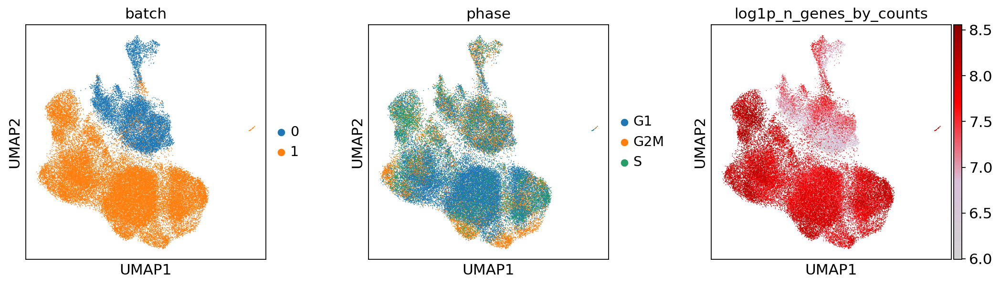

In [19]:
sc.pl.umap(adata, color=['batch', 'phase', 'log1p_n_genes_by_counts'], color_map=cmap, wspace=0.3)

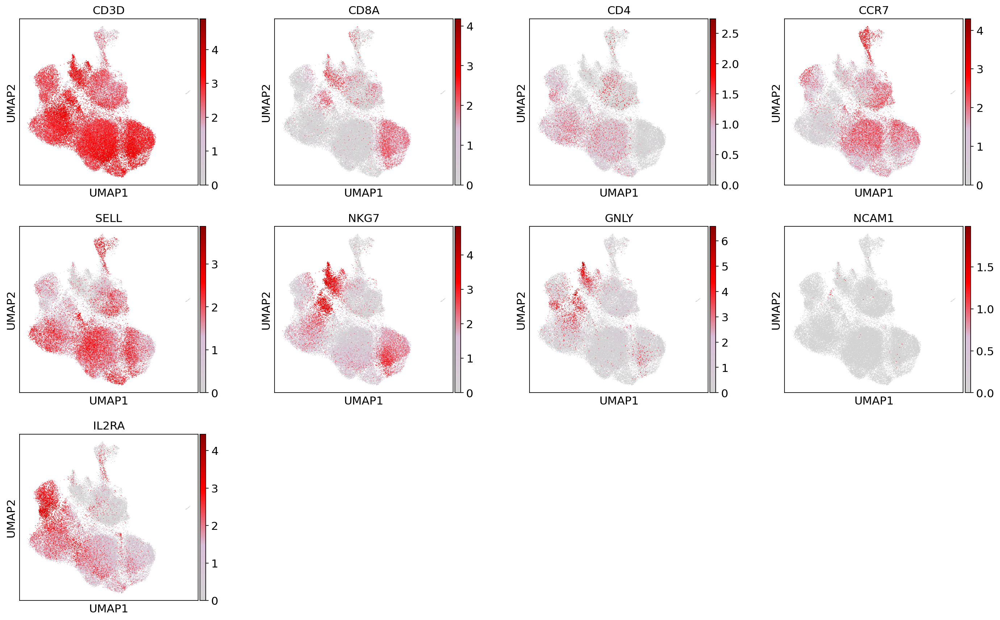

In [20]:
sc.pl.umap(adata, color=GL4, color_map=cmap, wspace=0.3)

In [21]:
#adata = sc.read('./write/Tcells_combined_processed_regressoutcc.h5ad')

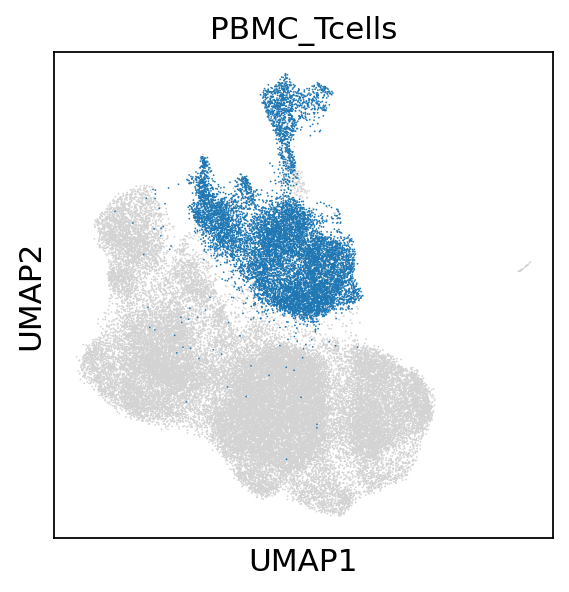

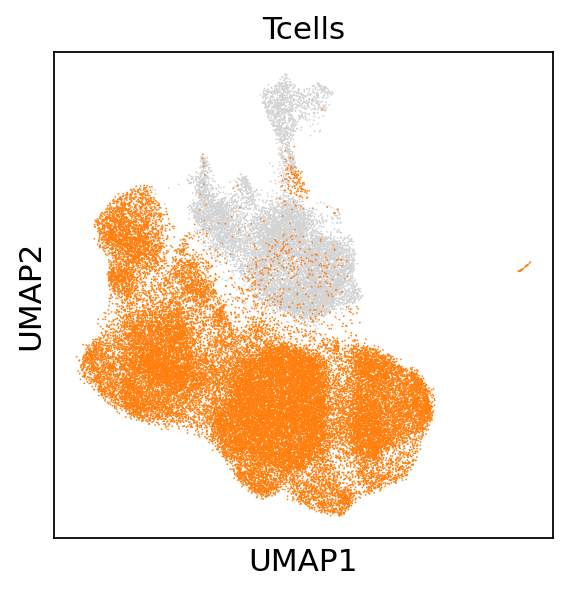

In [22]:
sc.pl.umap(adata, color=['batch'], groups=['0'], legend_loc='', title='PBMC_Tcells', save='_Tcells_combined_PBMCTcells.pdf')
sc.pl.umap(adata, color=['batch'], groups=['1'], legend_loc='', title='Tcells', save='_Tcells_combined_Tcells.pdf')

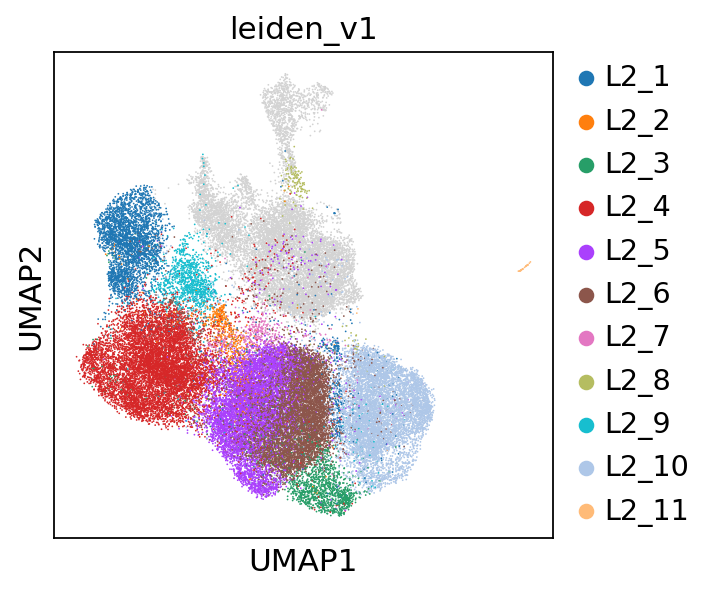

In [23]:
sc.pl.umap(adata, color=['leiden_v1'], groups=['L2_'+str(x+1) for x in range(11)], save='_Tcells_combined_leiden_v1.pdf')

In [24]:
adata.write('./write/Tcells_combined_processed_regressoutcc.h5ad')

In [25]:
adata = sc.read('./write/Tcells_combined_processed_regressoutcc.h5ad')

In [27]:
adata = bbknn.bbknn(adata, neighbors_within_batch = 7, copy=True)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:06)


In [28]:
adata.obsp['distances'] = adata.uns['neighbors']['distances']
adata.obsp['connectivities'] = adata.uns['neighbors']['connectivities']
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:20)


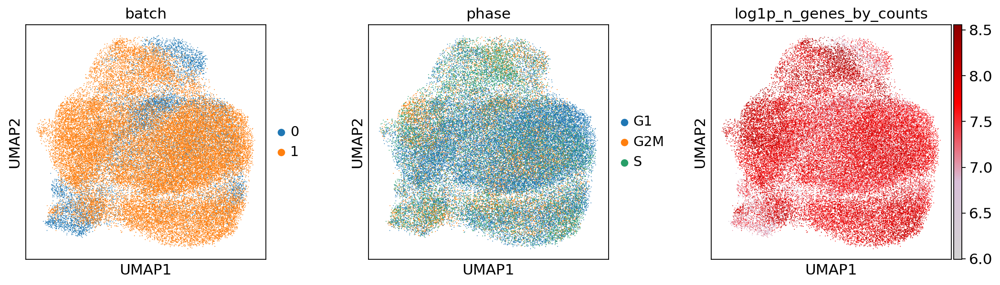

In [29]:
sc.pl.umap(adata, color=['batch', 'phase', 'log1p_n_genes_by_counts'], color_map=cmap, wspace=0.3)

In [2]:
adata = sc.read('./write/Tcells_combined_processed_regressoutcc_bbknn.h5ad')

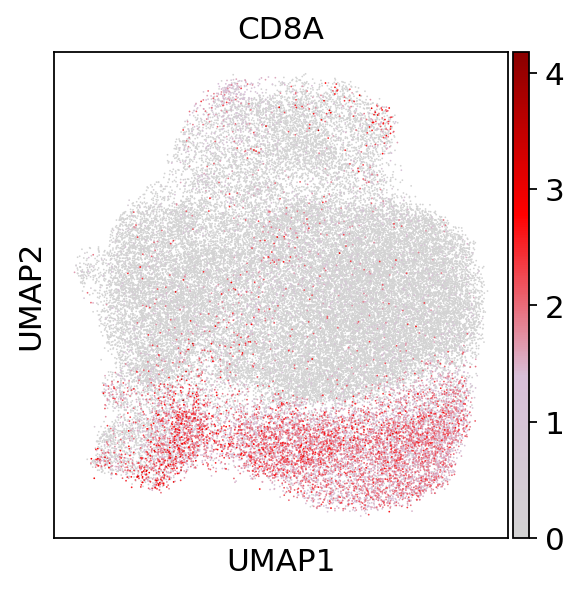

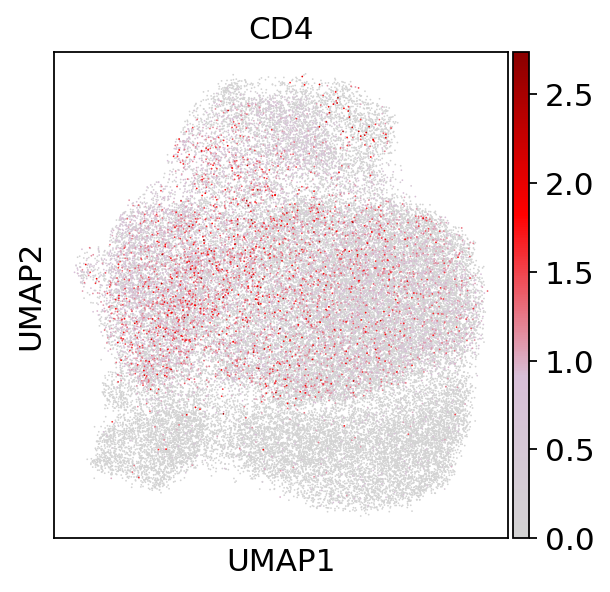

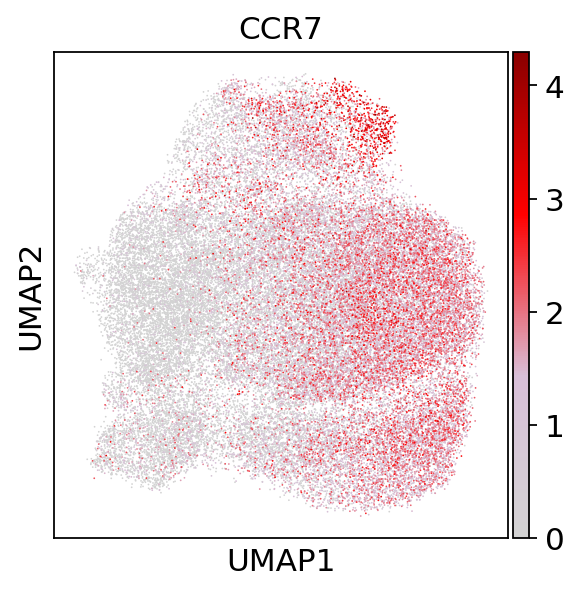

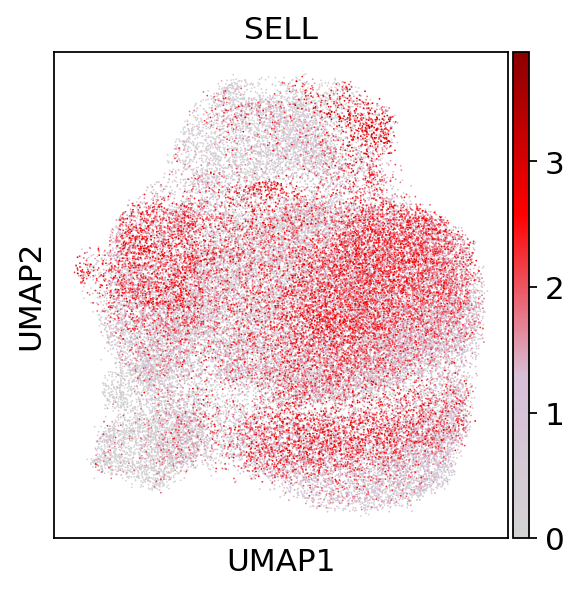

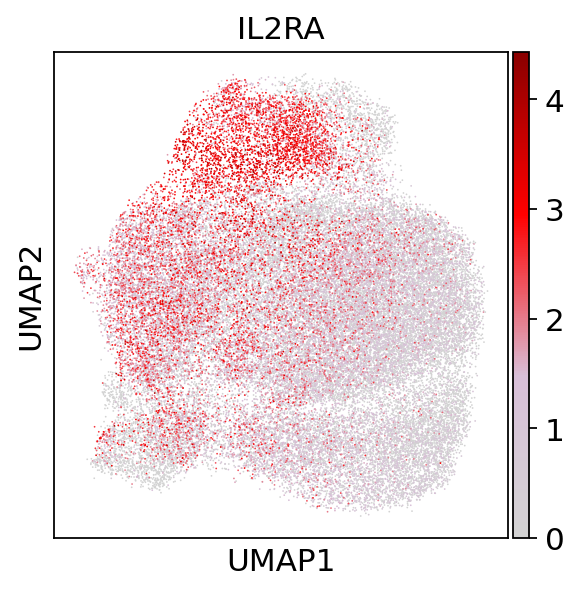

In [4]:
GL = ['CD8A', 'CD4', 'CCR7', 'SELL', 'IL2RA']
for i in GL:
    sc.pl.umap(adata, color=i, color_map=cmap, save='_PBMC_Tcells_Tcells_bbknn_'+i+'.pdf')

In [31]:
#adata =sc.read('./write/Tcells_combined_processed_regressoutcc_bbknn.h5ad')

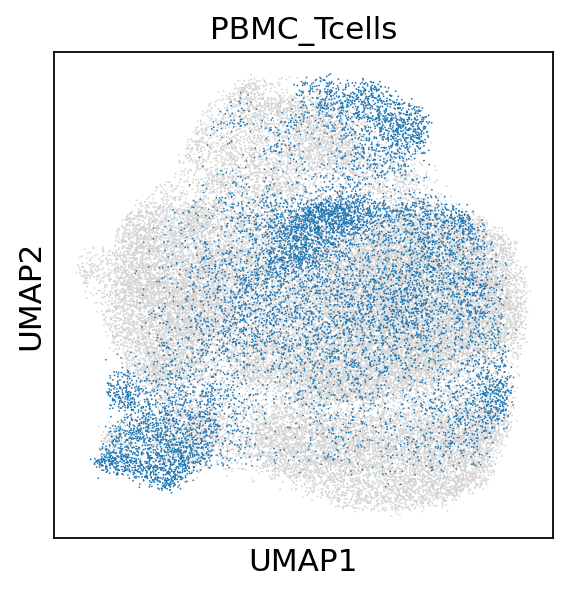

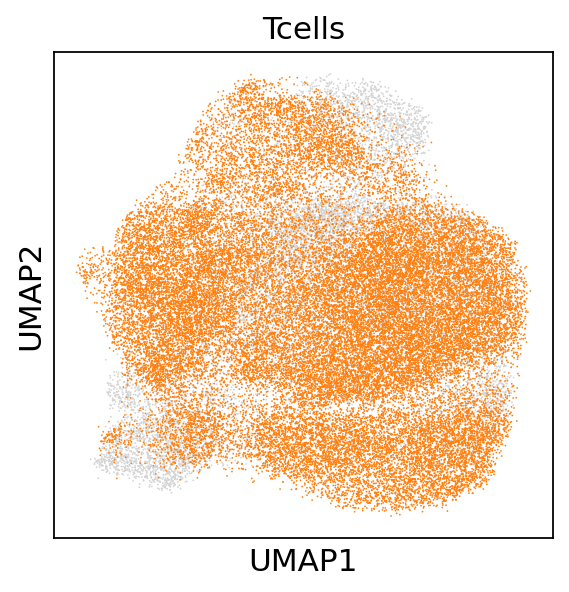

In [32]:
sc.pl.umap(adata, color=['batch'], groups=['0'], legend_loc='', title='PBMC_Tcells', save='_Tcells_combined_bbknn_PBMCTcells.pdf')
sc.pl.umap(adata, color=['batch'], groups=['1'], legend_loc='', title='Tcells', save='_Tcells_combined_bbknn_Tcells.pdf')

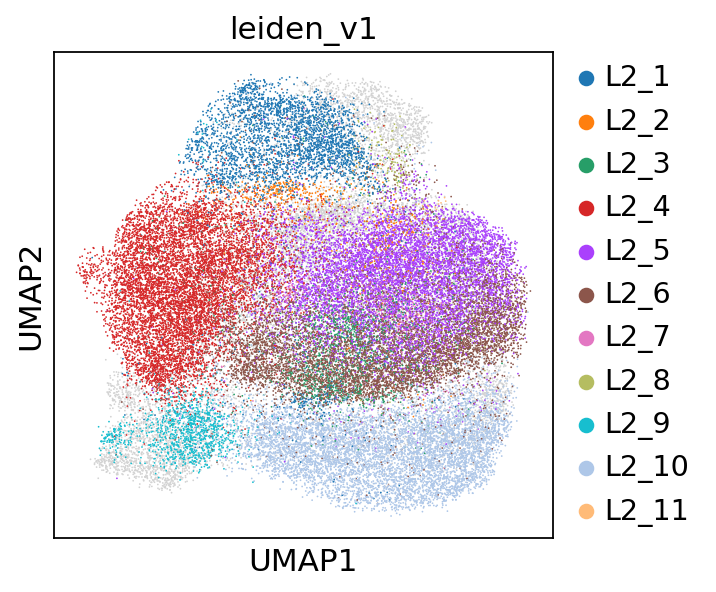

In [33]:
sc.pl.umap(adata, color=['leiden_v1'], groups=['L2_'+str(x+1) for x in range(11)], save='_Tcells_combined_bbknn_leiden_v1.pdf')

In [34]:
adata.write('./write/Tcells_combined_processed_regressoutcc_bbknn.h5ad')

# Assign clusters for PBMC T cells

In [15]:
adata = sc.read('./write/Tcells_combined_processed_regressoutcc_bbknn.h5ad')

In [36]:
adata.obs['batch'].value_counts()

1    37898
0    10845
Name: batch, dtype: int64

In [37]:
from collections import Counter
connectivities = np.array(adata.obsp['connectivities'].nonzero())
newClass = np.array([])
for i in range(10845):
    idx = connectivities[1, :][connectivities[0,:] == i][-7:]
    ct = Counter(adata.obs['leiden_v1'].values[idx]).most_common(1)[0][0]
    newClass = np.append(newClass, ct)

In [38]:
pd.Series(newClass).value_counts()

L2_4     2133
L2_5     2133
L2_6     1568
L2_10    1409
L2_1     1409
L2_9     1346
L2_8      385
nan       153
L2_7      118
L2_2       94
L2_3       62
L2_11      35
dtype: int64

In [39]:
adata.obs['leiden_pred'] = np.append(newClass, np.array(['Tcells']*37898))

... storing 'leiden_pred' as categorical


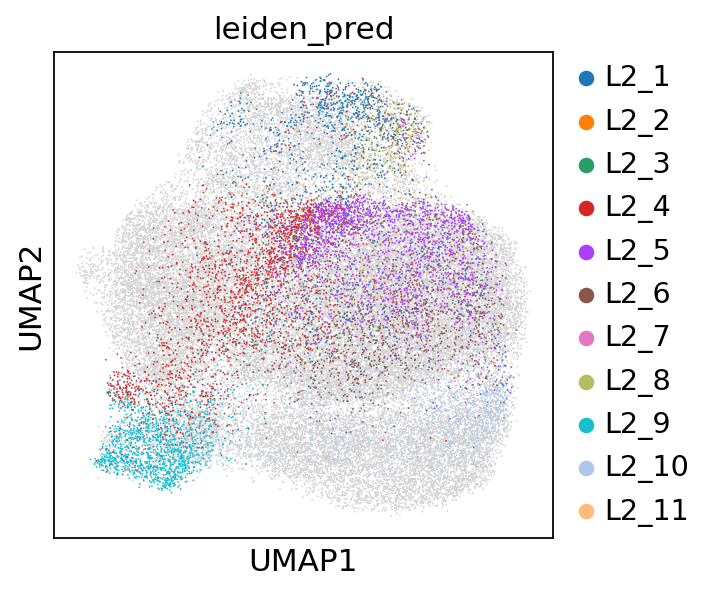

In [40]:
sc.pl.umap(adata, color=['leiden_pred'], groups=['L2_'+str(x+1) for x in range(11)])

In [41]:
# remove L2_2, L2_3, L2_7, L2_8, L2_11
# merge L2_5 and L2_6
CTconvert = {
    'L2_2': 'others',
    'L2_3': 'others',
    'L2_7': 'others',
    'L2_8': 'others',
    'L2_11': 'others',
    'L2_5': 'L2_56',
    'L2_6': 'L2_56'
}
adata.obs['leiden_v1_new'] = [CTconvert[x] if x in CTconvert.keys() else x for x in adata.obs['leiden_v1']]
adata.obs['leiden_pred_new'] = [CTconvert[x] if x in CTconvert.keys() else x for x in adata.obs['leiden_pred']]

In [20]:
adata.obs['leiden_v1_new'] = adata.obs['leiden_v1_new'].cat.reorder_categories(['L2_1', 'L2_4', 'L2_56', 'L2_9', 'L2_10', 'others', 'nan'])
adata.obs['leiden_pred_new'] = adata.obs['leiden_pred_new'].cat.reorder_categories(['L2_1', 'L2_4', 'L2_56', 'L2_9', 'L2_10', 'Tcells', 'others', 'nan'])

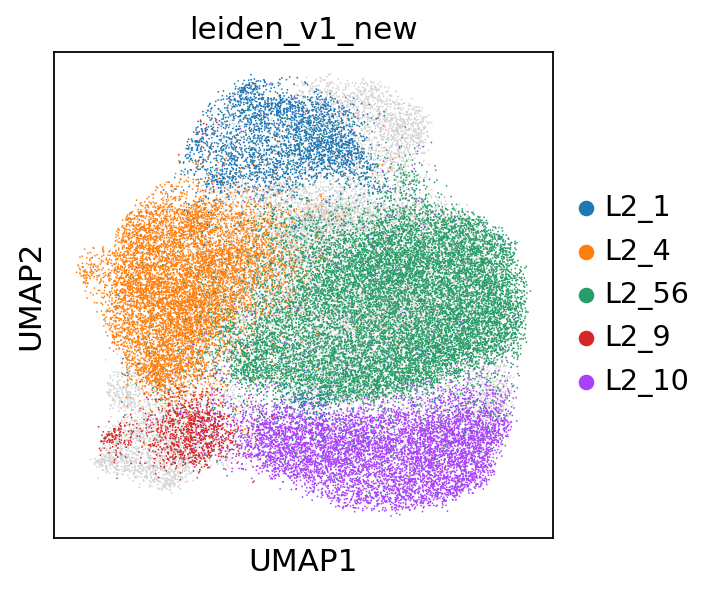

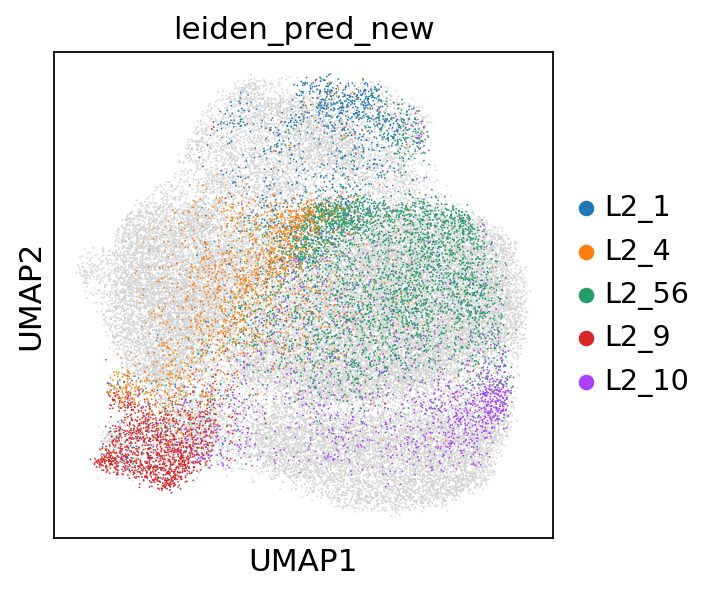

In [21]:
#adata.obs['leiden_v1_new'] = adata.obs['leiden_v1_new'].astype('category')
groups = [x for x in adata.obs['leiden_v1_new'].cat.categories if 'L2' in x ]
sc.pl.umap(adata, color=['leiden_v1_new'], groups=groups, save='_Tcells_combined_bbknn_leiden_v1_new.pdf')
sc.pl.umap(adata, color=['leiden_pred_new'], groups=groups, save='_Tcells_combined_bbknn_leiden_pred_new.pdf')

In [22]:
adata.write('./write/Tcells_combined_processed_regressoutcc_bbknn.h5ad')

In [2]:
# also write in the non corrected data
adata_nc = sc.read('./write/Tcells_combined_processed_regressoutcc.h5ad')

In [46]:
adata_nc.obs['leiden_v1_new'] = adata.obs['leiden_v1_new']
adata_nc.obs['leiden_pred_new'] = adata.obs['leiden_pred_new']

In [8]:
adata_nc.obs['leiden_v1_new'].cat.categories

Index(['L2_1', 'L2_10', 'L2_4', 'L2_56', 'L2_9', 'nan', 'others'], dtype='object')

In [10]:
adata_nc.obs['leiden_v1_new'] = adata_nc.obs['leiden_v1_new'].cat.reorder_categories(['L2_1', 'L2_4', 'L2_56', 'L2_9', 'L2_10', 'others', 'nan'])

In [9]:
adata_nc.obs['leiden_pred_new'].cat.categories

Index(['L2_1', 'L2_4', 'L2_9', 'L2_10', 'L2_56', 'Tcells', 'nan', 'others'], dtype='object')

In [12]:
adata_nc.obs['leiden_pred_new'] = adata_nc.obs['leiden_pred_new'].cat.reorder_categories(['L2_1', 'L2_4', 'L2_56', 'L2_9', 'L2_10', 'Tcells', 'others', 'nan'])

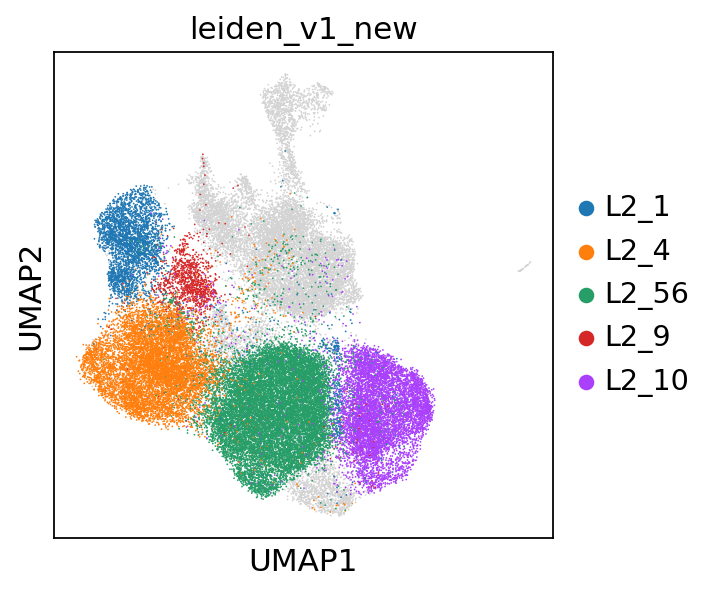

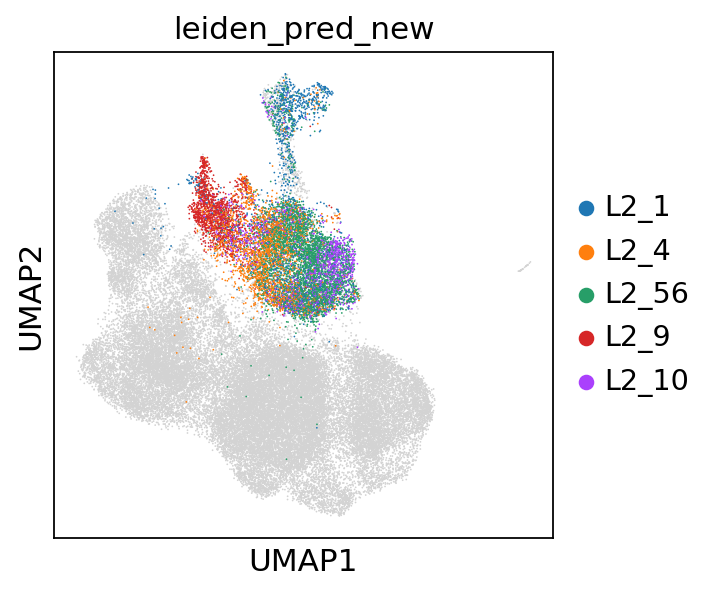

In [13]:
groups = [x for x in adata_nc.obs['leiden_v1_new'].cat.categories if 'L2' in x ]
sc.pl.umap(adata_nc, color=['leiden_v1_new'], groups=groups, save='_Tcells_combined_leiden_v1_new.pdf')
sc.pl.umap(adata_nc, color=['leiden_pred_new'], groups=groups, save='_Tcells_combined_leiden_pred_new.pdf')

In [14]:
adata_nc.write('./write/Tcells_combined_processed_regressoutcc.h5ad')

# DE analysis

In [3]:
adata = sc.read('./write/Tcells_combined_processed_regressoutcc.h5ad')

In [50]:
leiden_comb = np.empty(adata.shape[0], dtype=object)
idx1 = ['L2' in x for x in adata.obs['leiden_v1_new']]
leiden_comb[idx1] = 'Tcells_'+pd.Series(list(adata.obs['leiden_v1_new'][idx1].values)).astype(str)
idx2 = ['L2' in x for x in adata.obs['leiden_pred_new']]
leiden_comb[idx2] = 'PBMC_'+pd.Series(list(adata.obs['leiden_pred_new'][idx2].values)).astype(str)

In [51]:
adata.obs['leiden_comb'] = leiden_comb

In [52]:
adata.obs['leiden_comb_con'] = adata.obs['leiden_comb'].astype(str)+'_'+adata.obs['Condition'].astype(str)+'_'+adata.obs['Vec_binary'].astype(str)

In [7]:
print("L2_1 Product Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='Tcells_L2_1_Unstimulated_Vec-')))
print("L2_1 PBMC T cells Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='PBMC_L2_1_nan_nan')))

print("L2_4 Product Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='Tcells_L2_4_Unstimulated_Vec-')))
print("L2_4 PBMC T cells Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='PBMC_L2_4_nan_nan')))

print("L2_9 Product Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='Tcells_L2_9_Unstimulated_Vec-')))
print("L2_9 PBMC T cells Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='PBMC_L2_9_nan_nan')))

print("L2_10 Product Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='Tcells_L2_10_Unstimulated_Vec-')))
print("L2_10 PBMC T cells Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='PBMC_L2_10_nan_nan')))

print("L2_56 Product Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='Tcells_L2_56_Unstimulated_Vec-')))
print("L2_56 PBMC T cells Unsti Vec-: "+str(np.sum(adata.obs['leiden_comb_con']=='PBMC_L2_56_nan_nan')))

L2_1 Product Unsti Vec-: 114
L2_1 PBMC T cells Unsti Vec-: 1409
L2_4 Product Unsti Vec-: 3039
L2_4 PBMC T cells Unsti Vec-: 2133
L2_9 Product Unsti Vec-: 393
L2_9 PBMC T cells Unsti Vec-: 1346
L2_10 Product Unsti Vec-: 2911
L2_10 PBMC T cells Unsti Vec-: 1409
L2_56 Product Unsti Vec-: 5380
L2_56 PBMC T cells Unsti Vec-: 3701


In [54]:
sc.tl.rank_genes_groups(adata, groupby='leiden_comb_con', reference='PBMC_L2_1_nan_nan', groups=['Tcells_L2_1_Unstimulated_Vec-'], n_genes=adata.raw.shape[1], method='t-test', key_added='DE_L2_1')
sc.tl.rank_genes_groups(adata, groupby='leiden_comb_con', reference='PBMC_L2_4_nan_nan', groups=['Tcells_L2_4_Unstimulated_Vec-'], n_genes=adata.raw.shape[1], method='t-test', key_added='DE_L2_4')
sc.tl.rank_genes_groups(adata, groupby='leiden_comb_con', reference='PBMC_L2_9_nan_nan', groups=['Tcells_L2_9_Unstimulated_Vec-'], n_genes=adata.raw.shape[1], method='t-test', key_added='DE_L2_9')
sc.tl.rank_genes_groups(adata, groupby='leiden_comb_con', reference='PBMC_L2_10_nan_nan', groups=['Tcells_L2_10_Unstimulated_Vec-'], n_genes=adata.raw.shape[1], method='t-test', key_added='DE_L2_10')
sc.tl.rank_genes_groups(adata, groupby='leiden_comb_con', reference='PBMC_L2_56_nan_nan', groups=['Tcells_L2_56_Unstimulated_Vec-'], n_genes=adata.raw.shape[1], method='t-test', key_added='DE_L2_56')

ranking genes


... storing 'leiden_comb' as categorical
... storing 'leiden_comb_con' as categorical


    finished: added to `.uns['DE_L2_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['DE_L2_4']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['DE_L2_9']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.r

(48743, 1136)
(48743, 19442)


/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/smqpp/__init__.py:716: RuntimeWarning: divide by zero encountered in log2
  logExp = np.log2(normExp)


upRegulated gene: 2141
downRegulated gene: 817


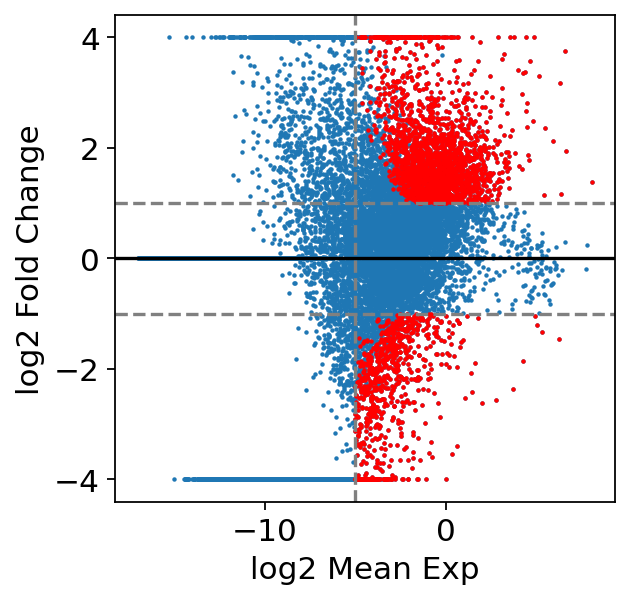

(48743, 1136)
(48743, 19442)
upRegulated gene: 4727
downRegulated gene: 384


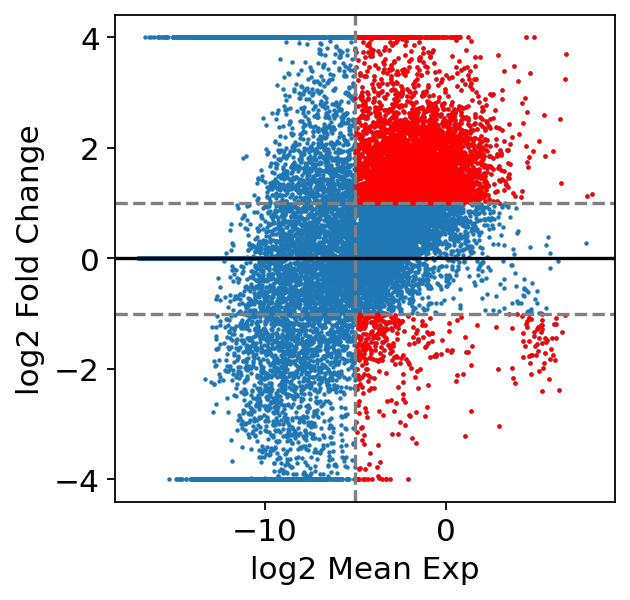

(48743, 1136)
(48743, 19442)
upRegulated gene: 3753
downRegulated gene: 356


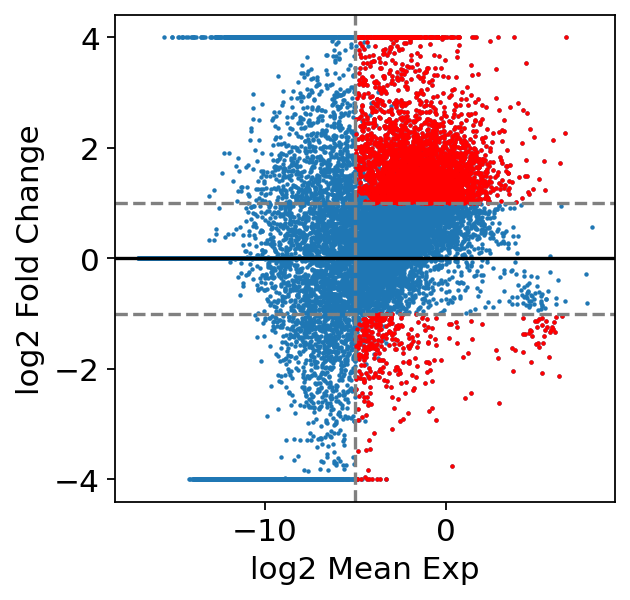

(48743, 1136)
(48743, 19442)
upRegulated gene: 4423
downRegulated gene: 239


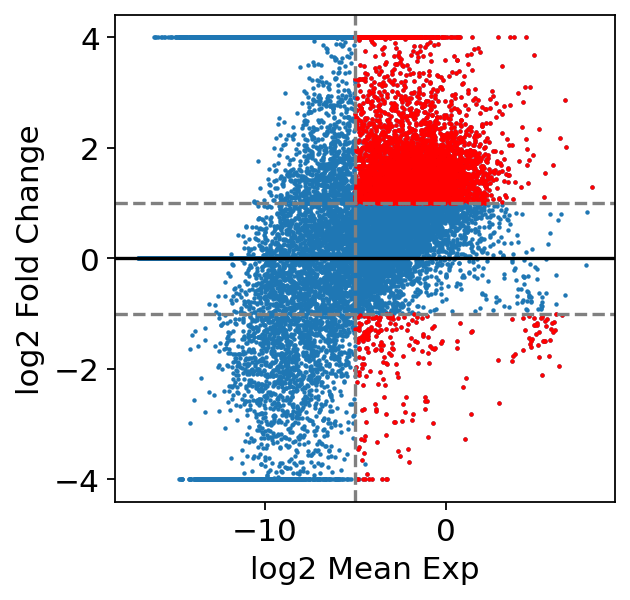

(48743, 1136)
(48743, 19442)
upRegulated gene: 3800
downRegulated gene: 253


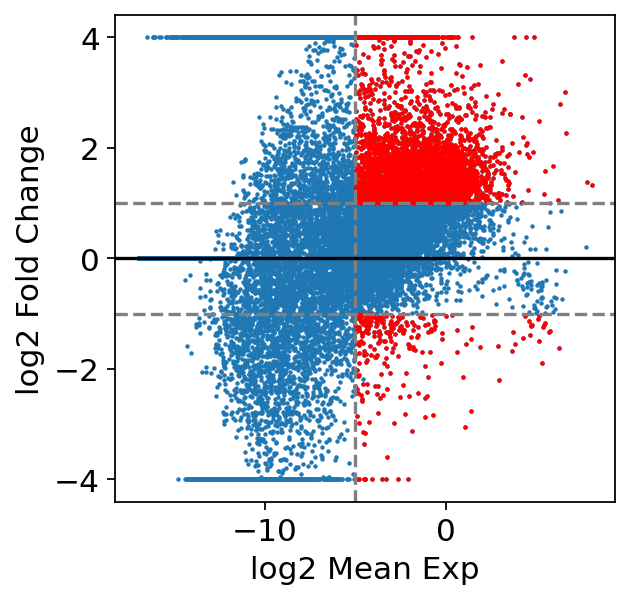

In [55]:
import smqpp
upG1, downG1, tableG1 = smqpp.plot_ma(adata, 'DE_L2_1', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5)
upG4, downG4, tableG4 = smqpp.plot_ma(adata, 'DE_L2_4', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5)
upG9, downG9, tableG9 = smqpp.plot_ma(adata, 'DE_L2_9', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5)
upG10, downG10, tableG10 = smqpp.plot_ma(adata, 'DE_L2_10', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5)
upG56, downG56, tableG56 = smqpp.plot_ma(adata, 'DE_L2_56', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5)

In [56]:
np.savetxt('./DEres/Tcells_combined/L2_1_TvsPBMC_upG.txt', upG1, delimiter='\t', fmt='%s')
np.savetxt('./DEres/Tcells_combined/L2_1_TvsPBMC_downG.txt', downG1, delimiter='\t', fmt='%s')
tableG1.to_csv('./DEres/Tcells_combined/L2_1_TvsPBMC_table.csv')
np.savetxt('./DEres/Tcells_combined/L2_4_TvsPBMC_upG.txt', upG4, delimiter='\t', fmt='%s')
np.savetxt('./DEres/Tcells_combined/L2_4_TvsPBMC_downG.txt', downG4, delimiter='\t', fmt='%s')
tableG4.to_csv('./DEres/Tcells_combined/L2_4_TvsPBMC_table.csv')
np.savetxt('./DEres/Tcells_combined/L2_9_TvsPBMC_upG.txt', upG9, delimiter='\t', fmt='%s')
np.savetxt('./DEres/Tcells_combined/L2_9_TvsPBMC_downG.txt', downG9, delimiter='\t', fmt='%s')
tableG9.to_csv('./DEres/Tcells_combined/L2_9_TvsPBMC_table.csv')
np.savetxt('./DEres/Tcells_combined/L2_10_TvsPBMC_upG.txt', upG10, delimiter='\t', fmt='%s')
np.savetxt('./DEres/Tcells_combined/L2_10_TvsPBMC_downG.txt', downG10, delimiter='\t', fmt='%s')
tableG10.to_csv('./DEres/Tcells_combined/L2_10_TvsPBMC_table.csv')
np.savetxt('./DEres/Tcells_combined/L2_56_TvsPBMC_upG.txt', upG56, delimiter='\t', fmt='%s')
np.savetxt('./DEres/Tcells_combined/L2_56_TvsPBMC_downG.txt', downG56, delimiter='\t', fmt='%s')
tableG56.to_csv('./DEres/Tcells_combined/L2_56_TvsPBMC_table.csv')

In [50]:
# pathway analysis c2
# c2 all curated
with open('/home/xw251/rds/rds-bg200-hphi-gottgens/users/xw251/Files/Pathway_DB/c2.all.v7.1.symbols.gmt') as f:
    DBcont = f.readlines()
    
DBcont = np.array(DBcont)
DBcont = DBcont[[(('BIOCARTA_' in x) | ('REACTOME_' in x) | ('PID_' in x) | ('KEGG_' in x) | ('HALLMARK_' in x)) for x in DBcont]]

# c5 GO bp
with open('/home/xw251/rds/rds-bg200-hphi-gottgens/users/xw251/Files/Pathway_DB/c5.bp.v7.1.symbols.gmt') as f:
    DBcont1 = f.readlines()
DBcont1 = np.array(DBcont1)

# c7 immuno
with open('/home/xw251/rds/rds-bg200-hphi-gottgens/users/xw251/Files/Pathway_DB/c7.all.v7.2.symbols.gmt') as f:
    DBcont2 = f.readlines()
DBcont2 = np.array(DBcont2)

TotalGenes = adata.raw.var_names

4727
3753
4423
3800
353
(353, 4)


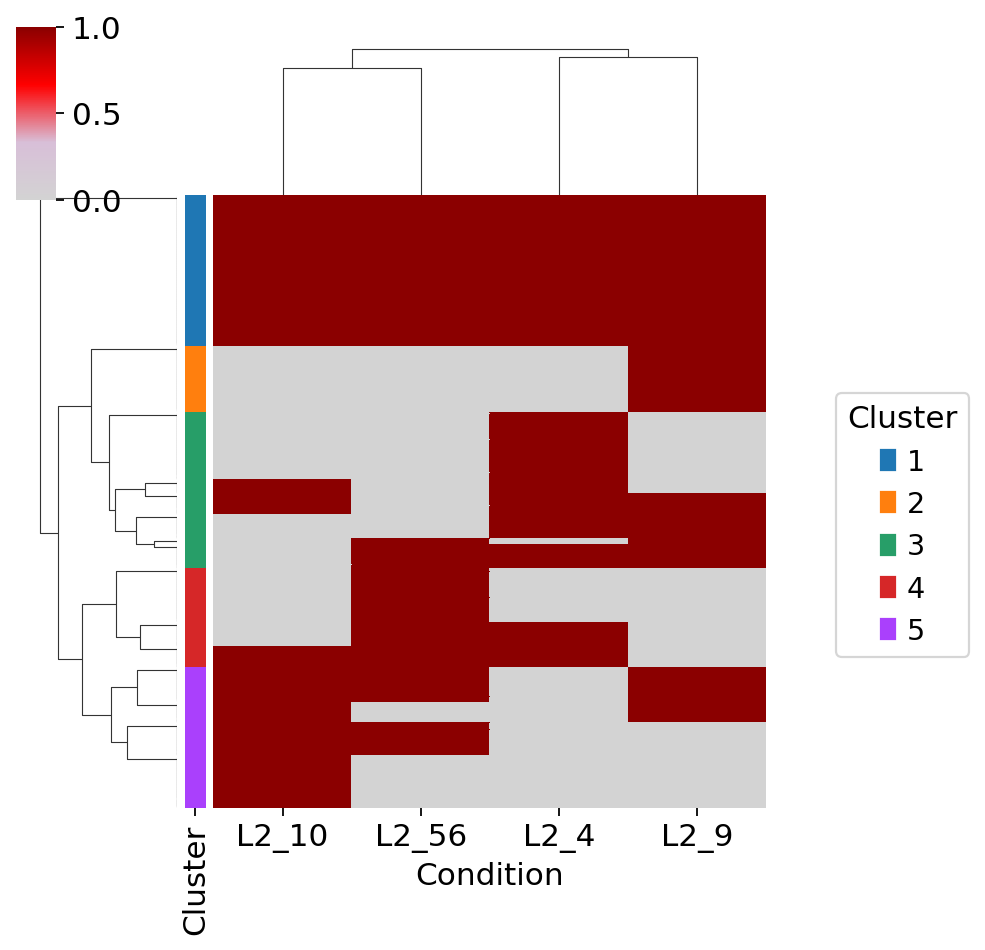

In [46]:
upG4 = np.genfromtxt('./DEres/Tcells_combined/L2_4_TvsPBMC_upG.txt', dtype=str)
print(len(upG4))
upG9 = np.genfromtxt('./DEres/Tcells_combined/L2_9_TvsPBMC_upG.txt', dtype=str)
print(len(upG9))
upG10 = np.genfromtxt('./DEres/Tcells_combined/L2_10_TvsPBMC_upG.txt', dtype=str)
print(len(upG10))
upG56 = np.genfromtxt('./DEres/Tcells_combined/L2_56_TvsPBMC_upG.txt', dtype=str)
print(len(upG56))
import seaborn as sns
ntop = 200
DEGL = {
    #'L2_1': upG1[0:ntop],
    'L2_4': upG4[0:ntop],
    'L2_9': upG9[0:ntop],
    'L2_10':upG10[0:ntop],
    'L2_56': upG56[0:ntop]
}
DEGL_unique = np.unique(np.concatenate([DEGL[x] for x in DEGL.keys()]))
print(len(DEGL_unique))
DEGL_matrix = np.vstack([np.in1d(DEGL_unique, DEGL[x])*1 for x in DEGL.keys()]).T
print(DEGL_matrix.shape)
DEGL_df = pd.DataFrame(DEGL_matrix)
DEGL_df.columns = DEGL.keys()
DEGL_df.index = DEGL_unique

c2_dist = sp.distance.pdist(DEGL_df)
h2 = hc.linkage(c2_dist, method='ward')

k=5
CL_up = fcluster(h2, k, criterion='maxclust')

row_colors = pd.Series(CL_up).astype('category')
row_cat = list(row_colors.cat.categories)
row_col = sc.pl.palettes.vega_20_scanpy[0:len(row_cat)]
my_palette = dict(zip(row_cat, row_col))
row_colors = row_colors.map(my_palette).values.astype('category')
row_colors = pd.DataFrame(np.array(row_colors))
row_colors.columns = ['Cluster']
row_colors.index = DEGL_unique

legend_TN = []
for i in range(len(row_cat)):
    legend_TN.append(mpatches.Patch(color=row_col[i], label=row_cat[i]))

#cmap1 = LinearSegmentedColormap.from_list(name='heatmap_cmap', colors=['#2f4f4f', 'grey', 'white', 'red','#8b0000']) 

import matplotlib.patches as mpatches
g = sns.clustermap(DEGL_df,row_linkage=h2,col_cluster=True,method="ward",yticklabels=False, xticklabels=True, cmap=cmap,figsize=(5,6), row_colors=row_colors) 
g.ax_heatmap.set_xlabel("Condition")
l1=g.ax_heatmap.legend(title='Cluster', loc='upper left',bbox_to_anchor=(1.1,0.7),handles=legend_TN,frameon=True)

plt.savefig('./figures/Tcells_combined_upG_k5.pdf')

In [51]:
cGenes = {}
for i in np.unique(CL_up):
    cGenes[i] = np.sort(np.array(DEGL_unique)[CL_up==i])
    np.savetxt('./DEres/Tcells_combined_upG/c'+str(i)+'.txt', cGenes[i],delimiter='\t', fmt='%s')
#[smqpp.pathway_analysis(cGenes[x], TotalGenes, DBcont).to_csv('./DEres/Tcells_combined_upG/c'+str(x)+'_c2total_pathway.txt') for x in cGenes.keys()]
[smqpp.pathway_analysis(cGenes[x], TotalGenes, DBcont1).to_csv('./DEres/Tcells_combined_upG/c'+str(x)+'_c5total_pathway.txt') for x in cGenes.keys()]
[smqpp.pathway_analysis(cGenes[x], TotalGenes, DBcont2).to_csv('./DEres/Tcells_combined_upG/c'+str(x)+'_c7total_pathway.txt') for x in cGenes.keys()]

[None, None, None, None, None]

384
356
239
253
386


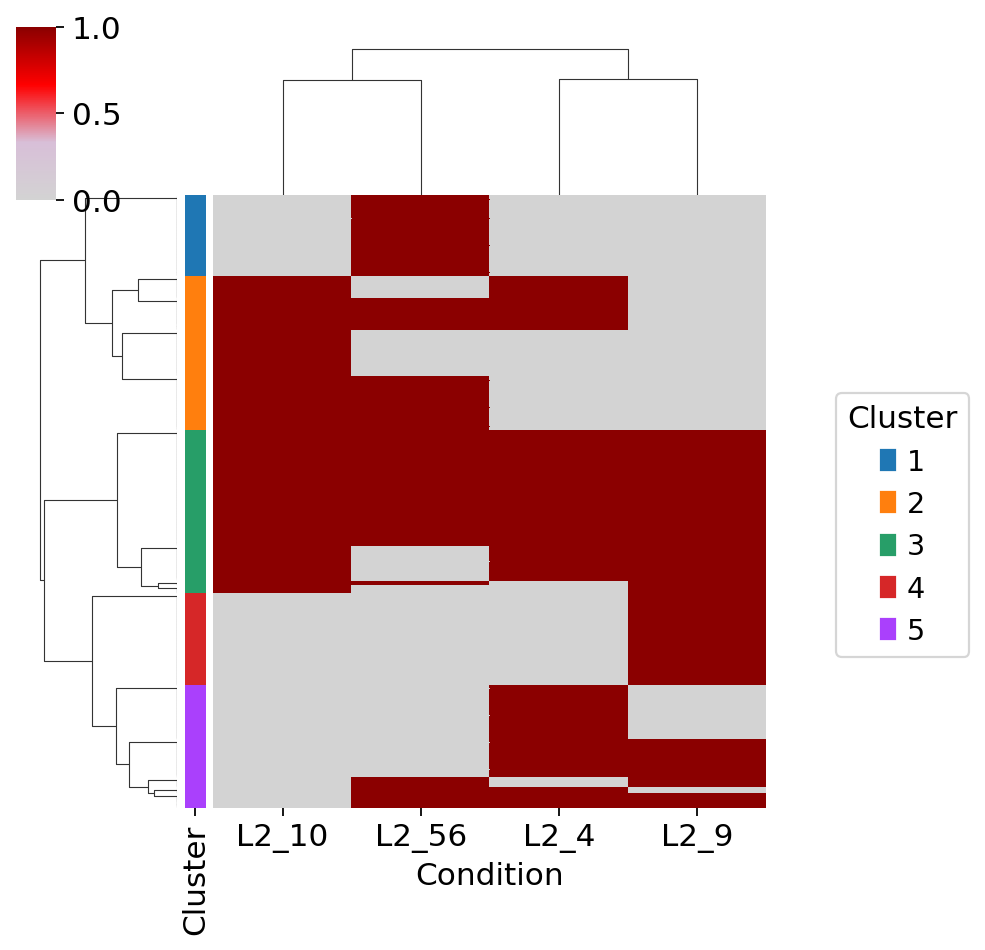

In [52]:
import seaborn as sns
import scipy.spatial as sp, scipy.cluster.hierarchy as hc
from scipy.cluster.hierarchy import fcluster
import matplotlib.patches as mpatches

downG4 = np.genfromtxt('./DEres/Tcells_combined/L2_4_TvsPBMC_downG.txt', dtype=str)
print(len(downG4))
downG9 = np.genfromtxt('./DEres/Tcells_combined/L2_9_TvsPBMC_downG.txt', dtype=str)
print(len(downG9))
downG10 = np.genfromtxt('./DEres/Tcells_combined/L2_10_TvsPBMC_downG.txt', dtype=str)
print(len(downG10))
downG56 = np.genfromtxt('./DEres/Tcells_combined/L2_56_TvsPBMC_downG.txt', dtype=str)
print(len(downG56))
import seaborn as sns
ntop = 200
DEGL = {
    #'L2_1': downG1[0:ntop],
    'L2_4': downG4[-ntop:],
    'L2_9': downG9[-ntop:],
    'L2_10':downG10[-ntop:],
    'L2_56': downG56[-ntop:]
}
DEGL_unique = np.unique(np.concatenate([DEGL[x] for x in DEGL.keys()]))
print(len(DEGL_unique))
DEGL_matrix = np.vstack([np.in1d(DEGL_unique, DEGL[x])*1 for x in DEGL.keys()]).T
DEGL_df = pd.DataFrame(DEGL_matrix)
DEGL_df.columns = DEGL.keys()
DEGL_df.index = DEGL_unique

c2_dist = sp.distance.pdist(DEGL_df)
h2 = hc.linkage(c2_dist, method='ward')

k=5
CL_down = fcluster(h2, k, criterion='maxclust')

row_colors = pd.Series(CL_down).astype('category')
row_cat = list(row_colors.cat.categories)
row_col = sc.pl.palettes.vega_20_scanpy[0:len(row_cat)]
my_palette = dict(zip(row_cat, row_col))
row_colors = row_colors.map(my_palette).values.astype('category')
row_colors = pd.DataFrame(np.array(row_colors))
row_colors.columns = ['Cluster']
row_colors.index = DEGL_unique

legend_TN = []
for i in range(len(row_cat)):
    legend_TN.append(mpatches.Patch(color=row_col[i], label=row_cat[i]))

#cmap1 = LinearSegmentedColormap.from_list(name='heatmap_cmap', colors=['#2f4f4f', 'grey', 'white', 'red','#8b0000']) 

import matplotlib.patches as mpatches
g = sns.clustermap(DEGL_df,row_linkage=h2,col_cluster=True,method="ward",yticklabels=False, xticklabels=True, cmap=cmap,figsize=(5,6), row_colors=row_colors) 
g.ax_heatmap.set_xlabel("Condition")
l1=g.ax_heatmap.legend(title='Cluster', loc='upper left',bbox_to_anchor=(1.1,0.7),handles=legend_TN,frameon=True)

plt.savefig('./figures/Tcells_combined_downG_k5.pdf')

In [53]:
cGenes = {}
for i in np.unique(CL_down):
    cGenes[i] = np.sort(np.array(DEGL_unique)[CL_down==i])
    #np.savetxt('./DEres/Tcells_combined_downG/c'+str(i)+'.txt', cGenes[i],delimiter='\t', fmt='%s')
#[smqpp.pathway_analysis(cGenes[x], TotalGenes, DBcont).to_csv('./DEres/Tcells_combined_downG/c'+str(x)+'_c2total_pathway.txt') for x in cGenes.keys()]
[smqpp.pathway_analysis(cGenes[x], TotalGenes, DBcont1).to_csv('./DEres/Tcells_combined_downG/c'+str(x)+'_c5total_pathway.txt') for x in cGenes.keys()]
[smqpp.pathway_analysis(cGenes[x], TotalGenes, DBcont2).to_csv('./DEres/Tcells_combined_downG/c'+str(x)+'_c7total_pathway.txt') for x in cGenes.keys()]

[None, None, None, None, None]

General pathway analysis for each up and down lists.

In [60]:
GL1_up_pathway = smqpp.pathway_analysis(upG1[0:ntop], TotalGenes, DBcont)
GL1_down_pathway = smqpp.pathway_analysis(downG1[-ntop:], TotalGenes, DBcont)
GL4_up_pathway = smqpp.pathway_analysis(upG4[0:ntop], TotalGenes, DBcont)
GL4_down_pathway = smqpp.pathway_analysis(downG4[-ntop:], TotalGenes, DBcont)
GL9_up_pathway = smqpp.pathway_analysis(upG9[0:ntop], TotalGenes, DBcont)
GL9_down_pathway = smqpp.pathway_analysis(downG9[-ntop:], TotalGenes, DBcont)
GL10_up_pathway = smqpp.pathway_analysis(upG10[0:ntop], TotalGenes, DBcont)
GL10_down_pathway = smqpp.pathway_analysis(downG10[-ntop:], TotalGenes, DBcont)
GL56_up_pathway = smqpp.pathway_analysis(upG56[0:ntop], TotalGenes, DBcont)
GL56_down_pathway = smqpp.pathway_analysis(downG56[-ntop:], TotalGenes, DBcont)

In [61]:
GL1_up_pathway.to_csv('./Pathway/Tcells_combined/L2_1_TvsPBMC_upG_top100.csv')
GL1_down_pathway.to_csv('./Pathway/Tcells_combined/L2_1_TvsPBMC_downG_top100.csv')
GL4_up_pathway.to_csv('./Pathway/Tcells_combined/L2_4_TvsPBMC_upG_top100.csv')
GL4_down_pathway.to_csv('./Pathway/Tcells_combined/L2_4_TvsPBMC_downG_top100.csv')
GL9_up_pathway.to_csv('./Pathway/Tcells_combined/L2_9_TvsPBMC_upG_top100.csv')
GL9_down_pathway.to_csv('./Pathway/Tcells_combined/L2_9_TvsPBMC_downG_top100.csv')
GL10_up_pathway.to_csv('./Pathway/Tcells_combined/L2_10_TvsPBMC_upG_top100.csv')
GL10_down_pathway.to_csv('./Pathway/Tcells_combined/L2_10_TvsPBMC_downG_top100.csv')
GL56_up_pathway.to_csv('./Pathway/Tcells_combined/L2_56_TvsPBMC_upG_top100.csv')
GL56_down_pathway.to_csv('./Pathway/Tcells_combined/L2_56_TvsPBMC_downG_top100.csv')

In [62]:
adata.write('./write/Tcells_combined_processed_regressoutcc.h5ad')

# Plot GL4

In [63]:
adata = sc.read('./write/Tcells_combined_processed_regressoutcc.h5ad')

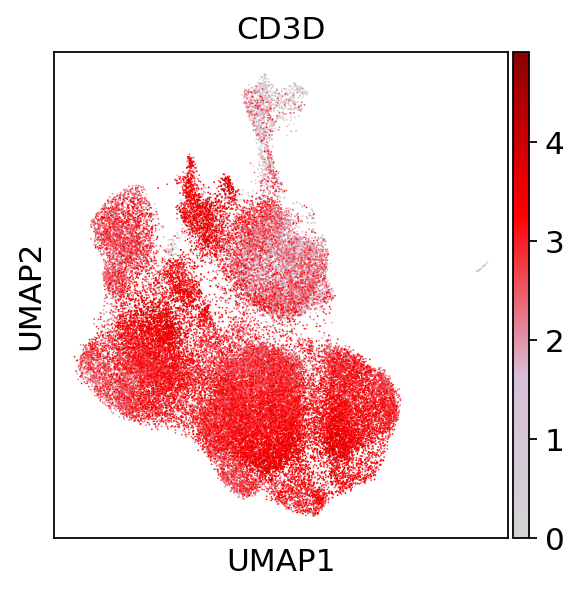

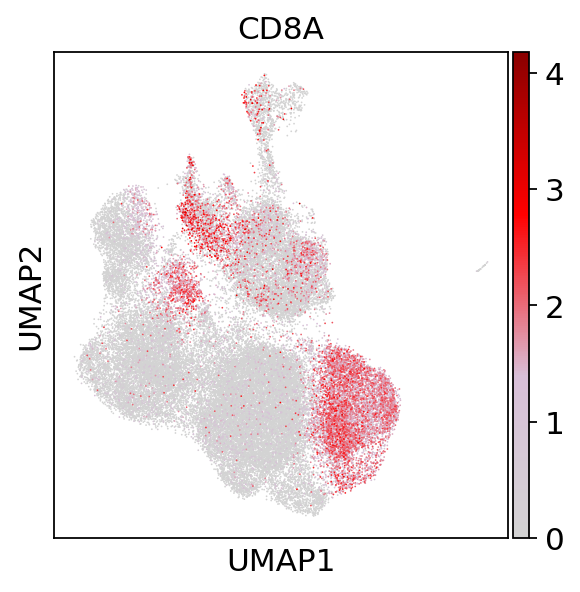

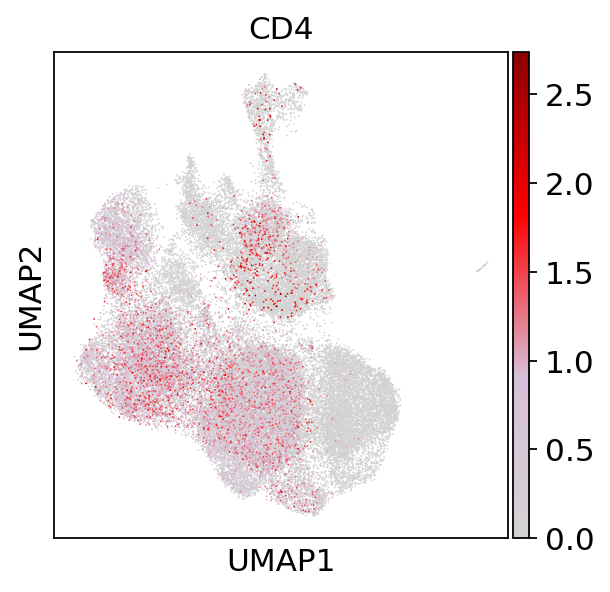

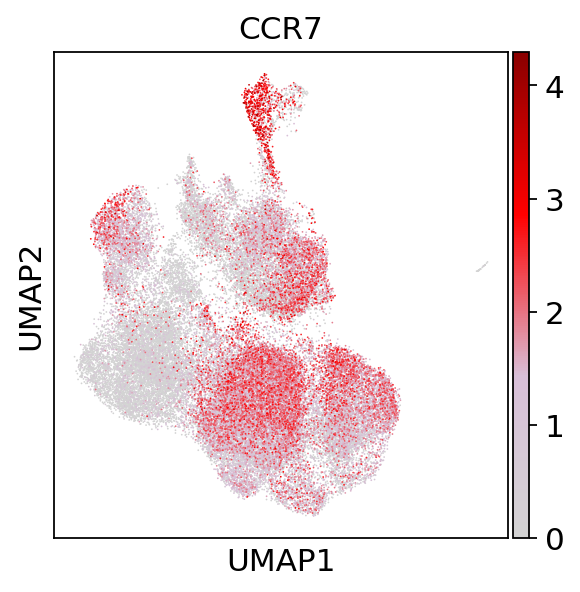

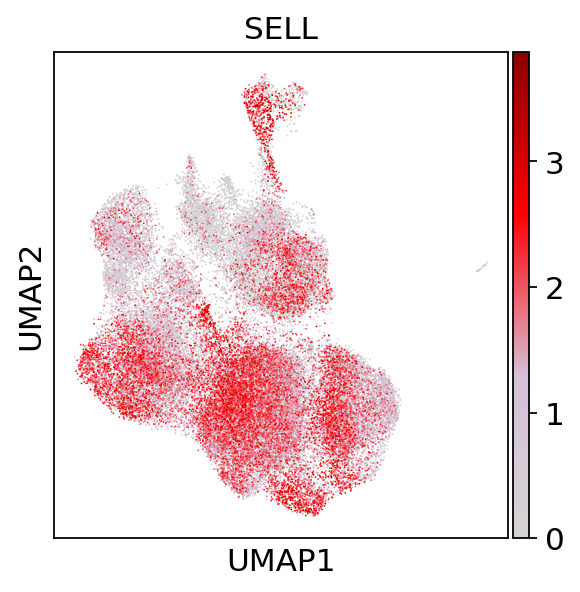

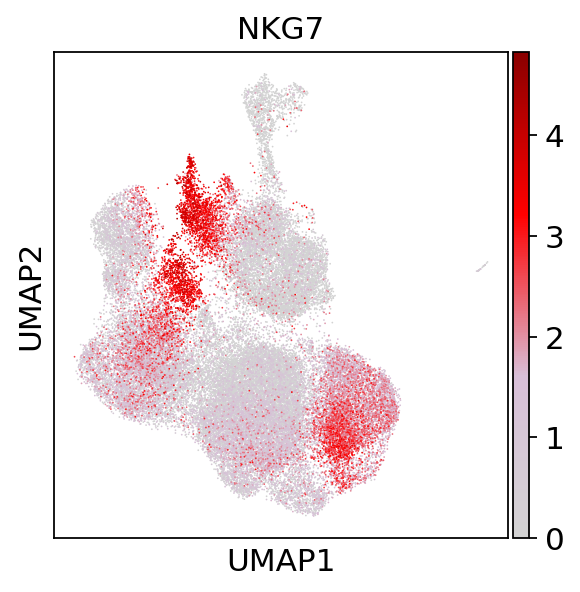

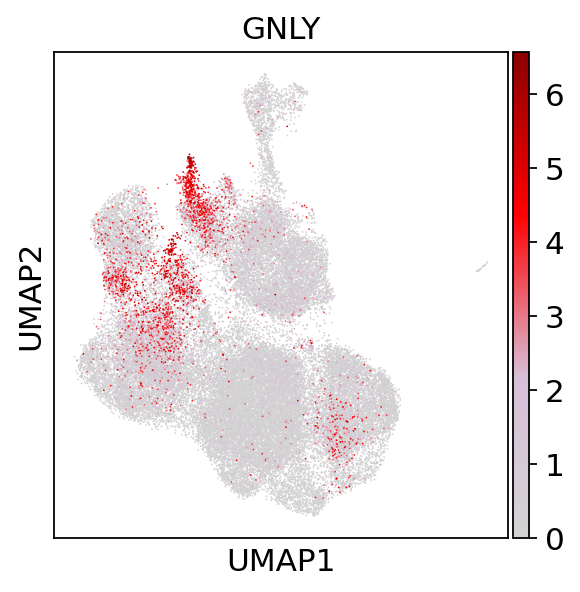

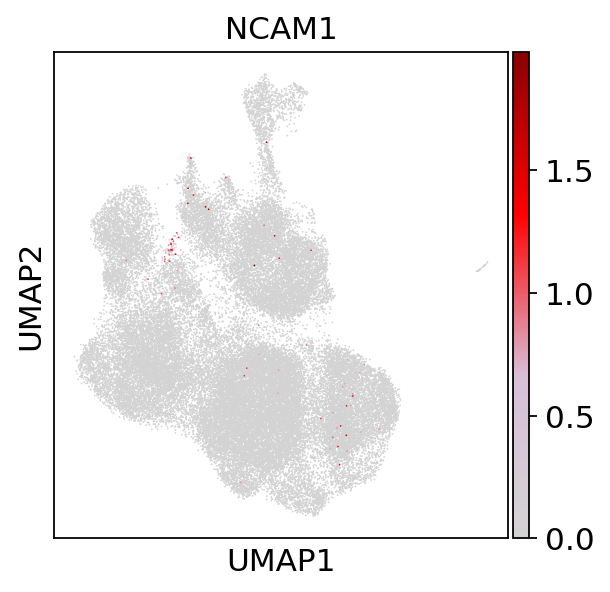

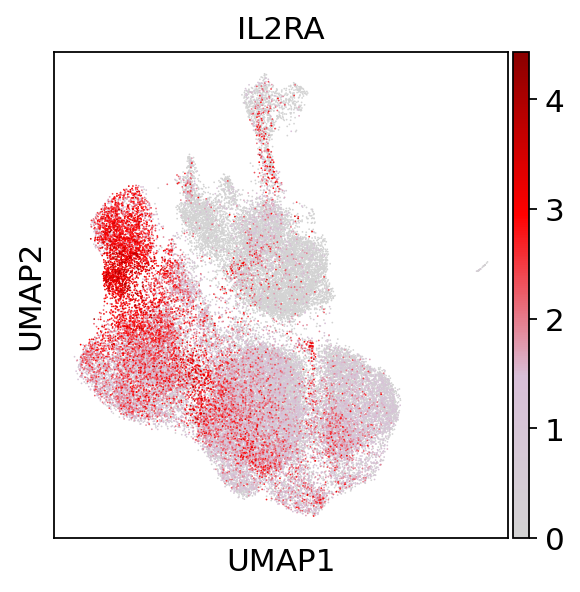

In [64]:
for i in GL4:
    sc.pl.umap(adata, color=i, color_map=cmap, title=i, save='_Tcells_combined_'+i+'.pdf')